#  Ideas for fitting code:

- pickle all FF objects

In [16]:
%load_ext autoreload
%autoreload 2

from ff_energy.cli import load_config_maker, load_all_theory, charmm_jobs
# from ff_energy.structure import
from ff_energy.potential import FF, LJ
import numpy as np
from ff_energy.data import Data, plot_ecol, plot_intE
import matplotlib.pyplot as plt
import pickle
from pathlib import Path
import pandas as pd 
from ff_energy.utils import pickle_output,read_from_pickle
from ff_energy.data import Data

sig_bound = (0.5, 4.0)
ep_bound = (0.00001, 1.0)
LJ_bound = [(sig_bound), (sig_bound), (ep_bound), (ep_bound)]


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [21]:


FUNC = LJ
BOUNDS = LJ_bound
ff_name = "pbe0dz_mdcm"
structure = "water_dimer"
pk = "pickles/water_cluster/pbe0_dz.mdcm"

#########################################################

ff_pkls = Path("pickles/ff")
ff_pickles = ff_pkls.glob("*.pkl")
ff_pickles = [_.name for _ in ff_pickles]
struct_dist_pkls = Path("pickles/structures")
struct_dist_pickles = struct_dist_pkls.glob("*.pkl")
struct_dist_pickles = [_.name for _ in struct_dist_pickles]


pickled_ff = (ff_pkls/f"{ff_name}.pkl").exists()
pickled_dists = (struct_dist_pkls/f"{ff_name}.pkl").exists()


if pickled_ff:
    print("Pickled FF exists!, loading: ", ff_pkls/f"{ff_name}.pkl")
    try:
        ff = next(read_from_pickle(ff_pkls / f"{ff_name}.pkl"))
    except StopIteration:
        print("Pickle read failed.")
        pickled_ff = False
    
if not pickled_ff:
    if pickled_dists:
        print("loading pickled distances/structure")
        structures, dists =  next(read_from_pickle(
            f"structures/{structure}.pkl"))
    else:
        print("No pickled distances/structure information, calculating:")
        CMS = load_config_maker("pbe0dz", structure, "mdcm")
        jobs = charmm_jobs(CMS)
        dists = {_.name.split(".")[0]: _.distances for _ in jobs[0].structures}
        structures = [_ for _ in jobs[0].structures]
        pickle_output((structures, dists), 
                      name=f"structures/{structure}")

    s = structures[0]
    data_ = Data(pk)
    ff = FF(data_.data,dists,FUNC,BOUNDS,s)

# d = ff.data_save.sample(200)
# ff.data = d.copy()
args = [1.7682,0.2245,-0.1521,-0.0460]


Pickled FF exists!, loading:  pickles/ff/pbe0dz_mdcm.pkl
Pickle read failed.
No pickled distances/structure information, calculating:
mdcm
Strcuture,PDB already already exists, loading structure from pickle
[('HT', 'HT'), ('HT', 'OT'), ('OT', 'OT')]
0 ('HT', 'HT') ('HT', 'HT')
1 ('HT', 'OT') ('HT', 'OT')
2 ('OT', 'OT') ('OT', 'OT')


In [22]:
print(len(ff.dists["test0"][15]))
print(len(ff.dists["test0"][17]))
print(len(ff.dists["test0"][20]))

190
380
190


500
test467 14.828794568696186 VDW      14.82881
intE   -51.714066
Name: test467, dtype: object
test471 14.543937102291611 VDW      14.54395
intE   -61.964509
Name: test471, dtype: object
test117 8.8099159991764 VDW       8.80992
intE   -29.798988
Name: test117, dtype: object
test96 18.10957011975697 VDW      18.10955
intE   -72.332202
Name: test96, dtype: object
test186 22.50908797071704 VDW      22.50911
intE   -67.438908
Name: test186, dtype: object
test30 12.95189423531681 VDW      12.95192
intE   -57.177697
Name: test30, dtype: object
test375 13.32872125701818 VDW      13.32872
intE   -69.772736
Name: test375, dtype: object
test121 19.42783322223334 VDW      19.42782
intE   -60.841806
Name: test121, dtype: object
test136 24.925508678083006 VDW      24.92551
intE   -89.896532
Name: test136, dtype: object
test18 22.642413624904954 VDW      22.64238
intE   -76.655917
Name: test18, dtype: object
test370 28.39047010960328 VDW      28.3905
intE   -52.17523
Name: test370, dtype: object
t

,ECOL,KEY,TOTAL,ELEC,VDW,KEY,M_ENERGY,KEY,C_ENERGY,intE,NBONDS,nb_intE,LJ,VDW_ERROR,VDW_SE,SE
test467,-113.436686,test467,21.39109,-81.32190,14.82881,test467,-1527.154217,test467,-1527.236629,-51.714066,-66.49309,-66.493105,14.828795,0.000015,2.381251e-10,218.420010
test471,-127.463435,test471,21.36685,-93.42710,14.54395,test471,-1527.144137,test471,-1527.242885,-61.964509,-78.88315,-78.883163,14.543937,0.000013,1.663509e-10,286.240837
test117,-87.465907,test117,23.93672,-59.12652,8.80992,test117,-1527.145615,test117,-1527.193103,-29.798988,-50.31660,-50.316604,8.809916,0.000004,1.600659e-11,420.972568
test96,-163.434955,test96,24.31647,-119.88982,18.10955,test96,-1527.131558,test96,-1527.246828,-72.332202,-101.78027,-101.780250,18.109570,-0.000020,4.048046e-10,867.187537
test186,-155.938399,test186,21.62421,-115.09755,22.50911,test186,-1527.145607,test186,-1527.253079,-67.438908,-92.58844,-92.588462,22.509088,0.000022,4.852893e-10,632.500053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
test48,NaN,NaN,21.38249,-110.66179,20.01366,test48,-1527.147549,test48,-1527.250885,-64.843945,-90.64813,-90.648184,20.013606,0.000054,2.906349e-09,665.858749
test381,NaN,NaN,22.34947,-104.26997,19.67678,test381,-1527.147167,test381,-1527.236541,-56.082083,-84.59319,-84.593124,19.676846,-0.000066,4.420267e-09,812.879437
test489,NaN,NaN,19.86517,-138.11558,32.25939,test489,-1527.152482,test489,-1527.269339,-73.327986,-105.85619,-105.856189,32.259391,-0.000001,1.496953e-12,1058.083957
test304,NaN,NaN,20.88239,-105.35181,17.28253,test304,-1527.150985,test304,-1527.239633,-55.626955,-88.06928,-88.069289,17.282521,0.000009,8.932002e-11,1052.505067


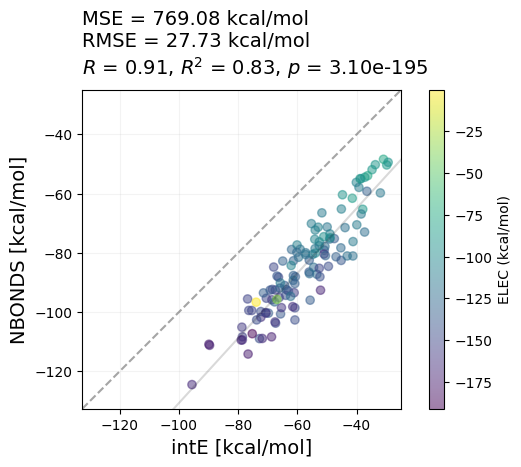

In [4]:
for i in range(1):
    # d = ff.data_save.sample(100)
    # ff.data = d.copy()
    print(len(ff.data))
    _ = ff.eval_func(args)
    print(_.keys())
    print(len(_.keys()))
    # _["nb_intE"] = _["NBONDS"]
    plot_intE(_)
    print(_["SE"].mean())
_

In [12]:
_["VDW_ERROR"].mean()

7.120359192895887e-07

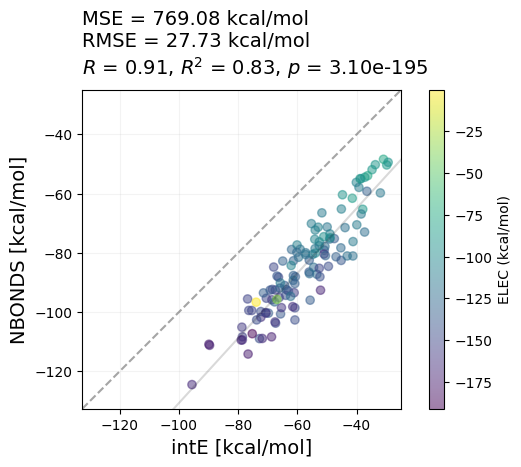

In [5]:
plot_intE(_)

In [9]:
for i in range(10):
    d = ff.data_save.sample(100)
    ff.data = d.copy()
    ff.fit_repeat(10, bounds=LJ_bound)
pickle_output(ff, "ff/pbe0dz_mdcm")

Optimizing LJ parameters...
function: LJ
bounds: [(0.5, 4.0), (0.5, 4.0), (1e-05, 1.0), (1e-05, 1.0)]
maxfev: 10000
initial guess: [1.8779832950406705, 2.689407130518672, 0.6123451047697691, 0.5320284011982225]
final_loss_fn:  22.96200039941367
       message: Optimization terminated successfully.
       success: True
        status: 0
           fun: 22.96200039941367
             x: [ 2.323e+00  9.188e-01  5.674e-03  1.111e-05]
           nit: 1189
          nfev: 1969
 final_simplex: (array([[ 2.323e+00,  9.188e-01,  5.674e-03,  1.111e-05],
                       [ 2.323e+00,  9.188e-01,  5.674e-03,  1.111e-05],
                       ...,
                       [ 2.323e+00,  9.188e-01,  5.674e-03,  1.111e-05],
                       [ 2.323e+00,  9.188e-01,  5.674e-03,  1.111e-05]]), array([ 2.296e+01,  2.296e+01,  2.296e+01,  2.296e+01,
                        2.296e+01]))
Set optimized parameters to FF object, self.df["LJ"] is updated.
Optimizing LJ parameters...
function: LJ
bou

PicklingError: Can't pickle <function LJ at 0x7f225da3a040>: it's not the same object as ff_energy.potential.LJ

In [6]:
# ff.get_best_loss()

0 ('CG331', 'CG331')
1 ('CG331', 'HGA3')
2 ('CG331', 'HGP1')
3 ('CG331', 'HT')
4 ('CG331', 'OG311')
5 ('CG331', 'OT')
6 ('HGA3', 'HGA3')
7 ('HGA3', 'HGP1')
8 ('HGA3', 'HT')
9 ('HGA3', 'OG311')
10 ('HGA3', 'OT')
11 ('HGP1', 'HGP1')
12 ('HGP1', 'HT')
13 ('HGP1', 'OG311')
14 ('HGP1', 'OT')
15 ('HT', 'HT')
16 ('HT', 'OG311')
17 ('HT', 'OT')
18 ('OG311', 'OG311')
19 ('OG311', 'OT')
20 ('OT', 'OT')


In [7]:
print(len(ff.data))
# plot_intE(ff.get_best_df())

500


In [8]:
results = pd.DataFrame(ff.opt_results)
best_func = results.sort_values("fun")[:10]
best_func

KeyError: 'fun'

<AxesSubplot: xlabel='rmse'>

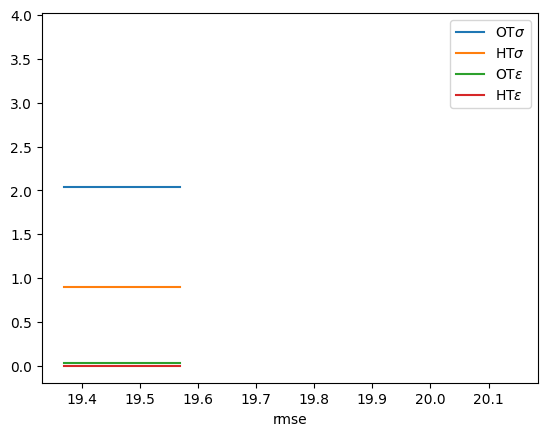

In [33]:
x = best_func["x"]
values = []
for _ in x:
    epsig = ["$\sigma$","$\epsilon$"]
    names = []
    for es in epsig:
        for at in ff.atom_types:
            names.append(at+es)
    values.append({names[i]: _[i] for i in range(len(_))})
    
    
values = pd.DataFrame(values)
values["rmse"] = best_func["fun"]

values.plot("rmse")
            
    

27.6 (400) 19.5 (100)
1995.5 (400) 1919.0 (100)
1995.5 (400) 1919.0 (100)
58.5 (400) 57.1 (100)
27.6 (400) 19.4 (100)
62.2 (400) 54.6 (100)
27.6 (400) 19.4 (100)
27.7 (400) 19.6 (100)
1995.5 (400) 1919.0 (100)
28.3 (400) 20.1 (100)


/home/boittier/Documents/phd/ff_energy/ff_energy/plot.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


27.7 (400) 25.6 (100)
2008.3 (400) 1867.6 (100)
59.1 (400) 63.8 (100)
2017.2 (400) 1876.1 (100)
27.0 (400) 25.2 (100)
27.0 (400) 25.2 (100)
59.1 (400) 63.8 (100)
27.0 (400) 25.2 (100)
27.0 (400) 25.2 (100)
59.1 (400) 63.8 (100)
61.3 (400) 56.5 (100)
27.2 (400) 20.9 (100)
2005.4 (400) 1879.0 (100)
63.2 (400) 58.1 (100)
2165.2 (400) 2028.9 (100)
2063.6 (400) 1934.2 (100)
27.2 (400) 20.9 (100)
63.2 (400) 58.1 (100)
27.2 (400) 20.9 (100)
28.0 (400) 21.9 (100)
1943.3 (400) 2127.7 (100)
60.8 (400) 59.2 (100)
1943.3 (400) 2127.7 (100)
70.5 (400) 79.9 (100)
398.1 (400) 492.6 (100)
25.6 (400) 27.3 (100)
26.0 (400) 26.9 (100)
60.8 (400) 59.2 (100)
1943.3 (400) 2127.7 (100)
1943.3 (400) 2127.7 (100)
25.1 (400) 28.3 (100)
1929.9 (400) 2181.4 (100)
1929.9 (400) 2181.4 (100)
58.6 (400) 65.5 (100)
25.1 (400) 28.2 (100)
70.0 (400) 94.3 (100)
1929.9 (400) 2181.4 (100)
25.1 (400) 28.3 (100)
56.8 (400) 64.1 (100)
58.7 (400) 65.5 (100)
26.1 (400) 26.0 (100)
52.4 (400) 56.2 (100)
26.5 (400) 26.3 (100)
57.4

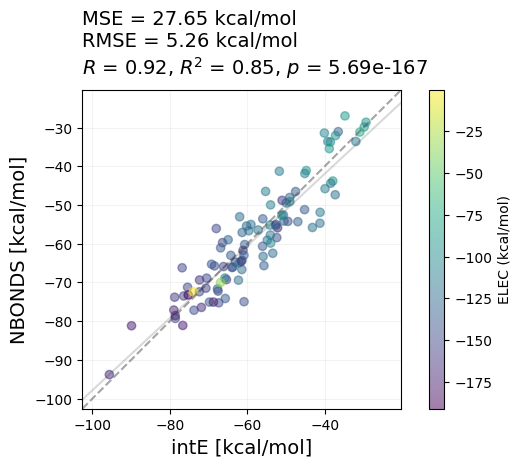

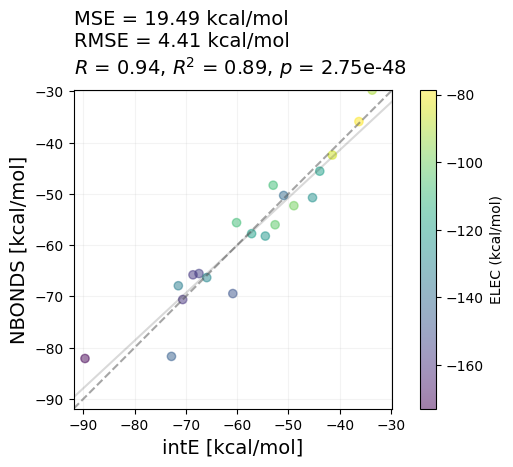

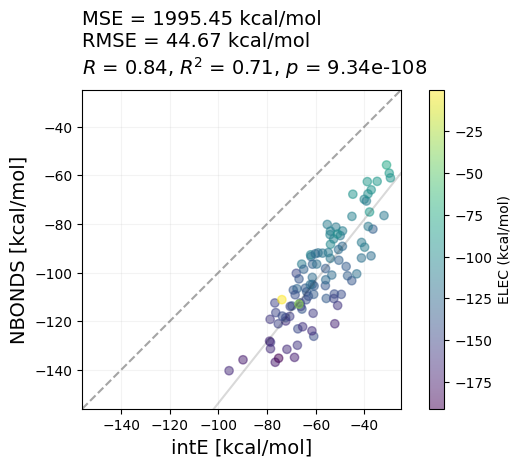

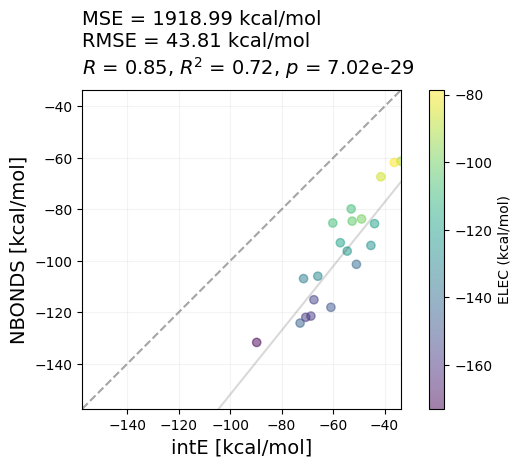

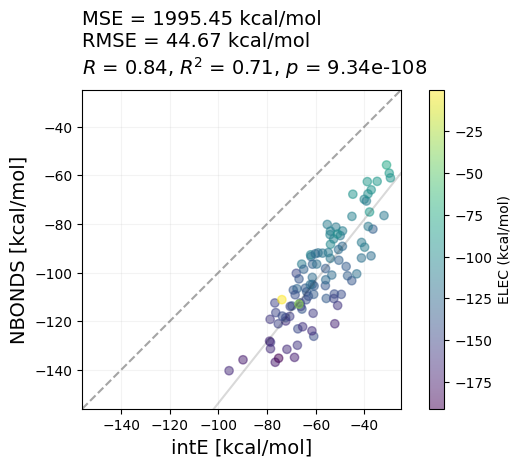

...

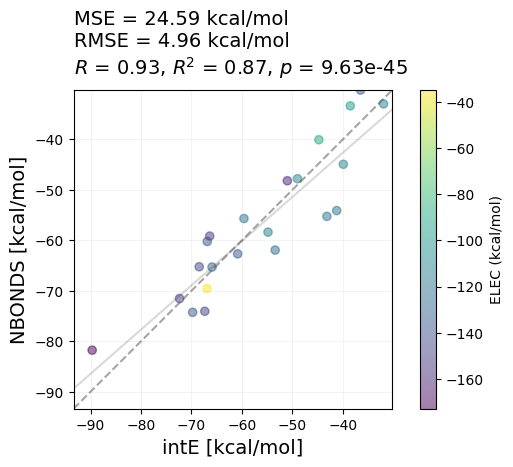

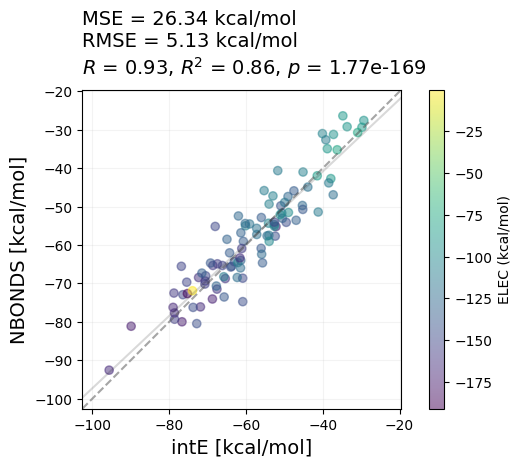

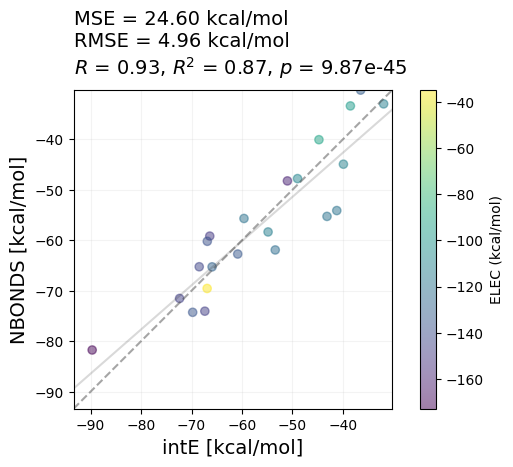

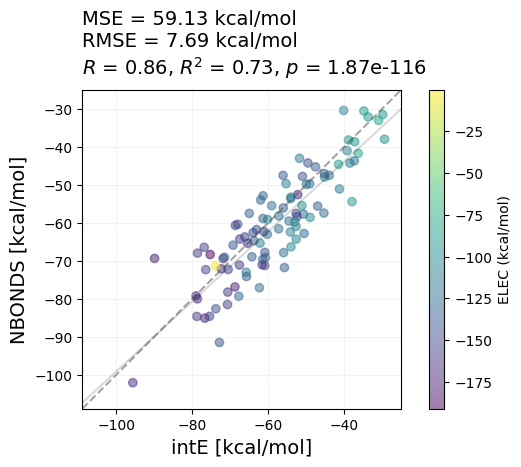

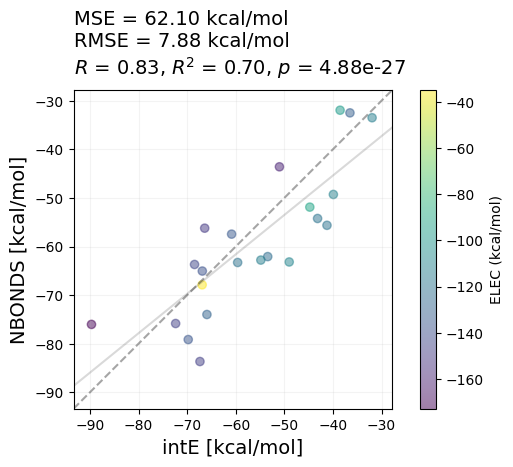

In [37]:
test_ = []
train_ = []
args_ = []
dfs_ = []

for res, data in zip(ff.opt_results,ff.opt_results_df):
    test_keys = [_ for _ in list(ff.data_save.index) if _ not in data.index ]
    test_df = ff.data_save.query("index in @test_keys")
    ff.data = test_df.copy()
    test_len = len(ff.data)
    test_res = ff.eval_func(res.x)
    plot_intE(test_res)
    
    ff.data = ff.data_save.query("index not in @test_keys").copy()
    train_len = len(ff.data)
    train_res = ff.eval_func(res.x)
    plot_intE(train_res)
    print("{:.1f} ({}) {:.1f} ({})".format(test_res["SE"].mean(),
                                           test_len,
         train_res["SE"].mean(),
         train_len))
    test_.append(test_res["SE"].mean())
    train_.append(train_res["SE"].mean())
    args_.append(res.x)
    dfs_.append(test_res)
    


In [39]:
df = pd.DataFrame({"test": test_, "train": train_, "args": args_, "df": dfs_})

In [40]:
best = df[df["train"] < 35]
# best["test"] = np.sqrt(best["test"])
# best["train"] = np.sqrt(best["train"]) 
best

,test,train,args,df
0,27.647208,19.487081,"[2.188637861627899, 0.5019792016482753, 0.0116...",ECOL KEY TOTAL E...
4,27.568966,19.369805,"[2.052679779118676, 0.5, 0.029258408741258603,...",ECOL KEY TOTAL E...
6,27.568300,19.370137,"[2.0521640245631927, 0.5055362950213639, 0.029...",ECOL KEY TOTAL E...
7,27.723972,19.569243,"[2.2555640994018886, 0.5, 0.007707121687257944...",ECOL KEY TOTAL E...
9,28.284256,20.145734,"[3.8289195136909306, 0.550109668136062, 1.0548...",ECOL KEY TOTAL E...
10,27.709804,25.610783,"[3.3194854887324405, 0.5, 6.807016262266477e-0...",ECOL KEY TOTAL E...
14,26.968500,25.220040,"[2.1490331237279934, 0.5, 0.01662270378884356,...",ECOL KEY TOTAL E...
15,26.966118,25.220114,"[2.1496709906961278, 0.5067199222050426, 0.016...",ECOL KEY TOTAL E...
17,26.968497,25.220040,"[2.149032471758595, 0.5, 0.01662277148729787, ...",ECOL KEY TOTAL E...
18,26.968099,25.220048,"[2.1490784270106085, 0.5007551044500769, 0.016...",ECOL KEY TOTAL E...


In [41]:
best.iloc[0]["df"]

,ECOL,KEY,TOTAL,ELEC,VDW,KEY,M_ENERGY,KEY,C_ENERGY,intE,NBONDS,LJ,VDW_ERROR,VDW_SE,nb_intE,SE
test467,-113.436686,test467,21.39109,-81.32190,14.82881,test467,-1527.154217,test467,-1527.236629,-51.714066,-66.49309,40.049876,-25.221066,636.102175,-41.272024,109.036241
test471,-127.463435,test471,21.36685,-93.42710,14.54395,test471,-1527.144137,test471,-1527.242885,-61.964509,-78.88315,40.396367,-25.852417,668.347475,-53.030733,79.812364
test117,-87.465907,test117,23.93672,-59.12652,8.80992,test117,-1527.145615,test117,-1527.193103,-29.798988,-50.31660,29.272955,-20.463035,418.735809,-29.853565,0.002979
test96,-163.434955,test96,24.31647,-119.88982,18.10955,test96,-1527.131558,test96,-1527.246828,-72.332202,-101.78027,50.522705,-32.413155,1050.612619,-69.367115,8.791740
test375,-136.608797,test375,18.96213,-113.72132,13.32872,test375,-1527.144874,test375,-1527.256065,-69.772736,-100.39260,38.656370,-25.327650,641.489875,-75.064950,28.007522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
test46,NaN,NaN,20.12016,-69.10660,9.83768,test46,-1527.156577,test46,-1527.224431,-42.578702,-59.26892,30.410835,-20.573155,423.254687,-38.695765,15.077192
test476,NaN,NaN,22.65088,-72.13575,5.61887,test476,-1527.148758,test476,-1527.230053,-51.013283,-66.51688,23.388080,-17.769210,315.744823,-48.747670,5.133003
test436,NaN,NaN,22.63871,-141.57886,28.26309,test436,-1527.131575,test436,-1527.250194,-74.433929,-113.31577,62.481020,-34.217930,1170.866765,-79.097840,21.752062
test489,NaN,NaN,19.86517,-138.11558,32.25939,test489,-1527.152482,test489,-1527.269339,-73.327986,-105.85619,64.928763,-32.669373,1067.287931,-73.186817,0.019929


Text(0, 0.5, 'Train')

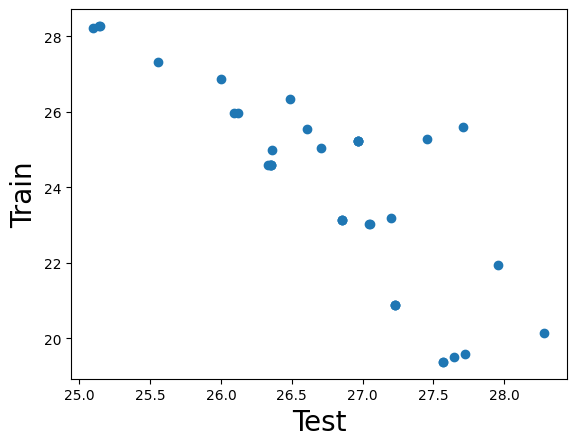

In [42]:
plt.scatter(best["test"], best["train"])
plt.xlabel("Test", fontsize=20)
plt.ylabel("Train", fontsize=20)

In [80]:
import matplotlib as mpl
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import matplotlib.path as mpath
import matplotlib.pyplot as plt

# # Prepare the data for the PathPatch below.
# Path = mpath.Path
# codes, verts = zip(*[
#     (Path.MOVETO, [0.018, -0.11]),
#     (Path.CURVE4, [-0.031, -0.051]),
#     (Path.CURVE4, [-0.115, 0.073]),
#     (Path.CURVE4, [-0.03, 0.073]),
#     (Path.LINETO, [-0.011, 0.039]),
#     (Path.CURVE4, [0.043, 0.121]),
#     (Path.CURVE4, [0.075, -0.005]),
#     (Path.CURVE4, [0.035, -0.027]),
#     (Path.CLOSEPOLY, [0.018, -0.11])])

# artists = [
#     mpatches.Circle((0, 0), 0.1, ec="none"),
#     mpatches.Rectangle((-0.025, -0.05), 0.05, 0.1, ec="none"),
#     mpatches.Wedge((0, 0), 0.1, 30, 270, ec="none"),
#     mpatches.RegularPolygon((0, 0), 5, radius=0.1),
#     mpatches.Ellipse((0, 0), 0.2, 0.1),
#     mpatches.Arrow(-0.05, -0.05, 0.1, 0.1, width=0.1),
#     mpatches.PathPatch(mpath.Path(verts, codes), ec="none"),
#     mpatches.FancyBboxPatch((-0.025, -0.05), 0.05, 0.1, ec="none",
#                             boxstyle=mpatches.BoxStyle("Round", pad=0.02)),
#     mlines.Line2D([-0.06, 0.0, 0.1], [0.05, -0.05, 0.05], lw=5),
# ]

# axs = plt.figure(figsize=(6, 6), layout="constrained").subplots(3, 3)
# for i, (ax, artist) in enumerate(zip(axs.flat, artists)):
#     artist.set(color=mpl.colormaps["hsv"](i / len(artists)))
#     ax.add_artist(artist)
#     ax.set(title=type(artist).__name__,
#            aspect=1, xlim=(-.2, .2), ylim=(-.2, .2))
#     ax.set_axis_off()
# plt.show()

In [51]:
import seaborn as sns
import matplotlib as mpl
# cmap = sns.color_palette("icefire", as_cmap=True)
# # cmap()
# # cmap = mpl.cm.cool
# norm = mpl.colors.Normalize(vmin=5, vmax=10)

# plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
#              cax=ax, orientation='horizontal', label='Some Units')

In [52]:
# sns.choose_diverging_palette(as_cmap=True)

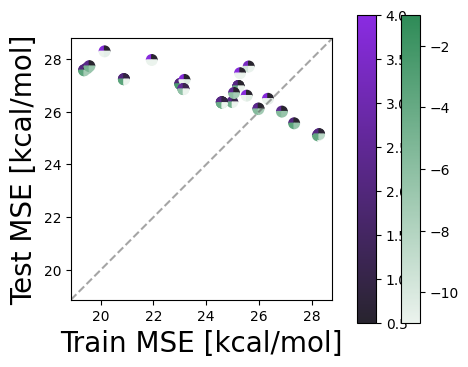

In [53]:

# cmap1 = sns.cubehelix_palette(start=.5, rot=-.99, as_cmap=True)
# cmap2 = sns.cubehelix_palette(start=.2, rot=-.99, as_cmap=True)
# cmap1 = sns.color_palette("Blues", as_cmap=True)
# cmap2 = sns.color_palette("Reds", as_cmap=True)
cmap1 = sns.color_palette("light:seagreen", as_cmap=True)
cmap2 = sns.color_palette("dark:blueviolet", as_cmap=True)


fig, ax = plt.subplots(1,3,figsize=(4.5, 4), 
                       gridspec_kw={'width_ratios': [3.5, 0.25,0.25]})

plt.subplots_adjust(wspace=0.25)

quarters = [(360,90),(90,180),(180,270),(270,360),]

def plot_circle(x,y,ax,res):
    # print(res)
    size = 0.2
    quarters = [(90,180),(0,90),(180,270),(270,0),]
    for i, (a,b) in enumerate(quarters):
        move = 0.0
        if i == 1:
            wedge = mpatches.Wedge((x, y), size, a, b)
        elif i == 0:
            wedge = mpatches.Wedge((x, y), size, a, b)
        elif i == 2:
            wedge = mpatches.Wedge((x, y+move), size, a, b)
        else:
            wedge = mpatches.Wedge((x, y+move), size, a, b)
        # wedge.set(color=mpl.colormaps["hsv"](i / 4))
        if i == 0 or i == 1:
            # print(res[i])
            cval = norm2(res[i])
            cmap = cmap2
        else:
            # print(res[i],np.log(res[i]))
            cval = norm1(np.log(res[i]))
            cmap = cmap1
        wedge.set(color=cmap(cval))
        if x < 27:
            wedge.set(alpha=1)
        ax.add_artist(wedge)
        # ax.set(aspect=1, xlim=(-.2, .2), ylim=(-.2, .2))
    return ax
    
norm1 = mpl.colors.Normalize(vmin=-11, vmax=-1)
norm2 = mpl.colors.Normalize(vmin=0.5, vmax=4)


    
# plt.scatter(best["test"], best["train"])
ax[0].set_xlabel("Train MSE [kcal/mol]", fontsize=20)
ax[0].set_ylabel("Test MSE [kcal/mol]", fontsize=20)
# plt.colorbar(cmap)
# plt.gca().set_axis_off()
minlim = min([best["test"].min(),best["train"].min()]) - .5
maxlim = max([best["test"].max(),best["train"].max()]) + .5

plt.colorbar(mpl.cm.ScalarMappable(norm=norm2, cmap=cmap2),
             cax=ax[1], orientation='vertical', label='')
plt.colorbar(mpl.cm.ScalarMappable(norm=norm1, cmap=cmap1),
             cax=ax[2], orientation='vertical', label='')

for x,y,res in zip(best["train"], best["test"], best["args"]):
    ax[0] = plot_circle(x,y,ax[0],res)

ax[0].set_xlim(minlim, maxlim)
ax[0].set_ylim(minlim, maxlim)
# ax[0].set_ylim(25, 29.5)
ax[0].plot(ax[0].get_xlim(), ax[0].get_ylim(), ls="--", c=".3", alpha=0.5)
# ax[0].grid()
ax[0].set_aspect(1)
plt.savefig("test.pdf",bbox_inches="tight")
plt.show()

In [85]:
from scipy.stats import bootstrap
rng = np.random.default_rng()
def boot_strap(best_res):
    data = (best_res["SE"],)  # samples must be in a sequence
    res = bootstrap(data, np.mean, confidence_level=0.95,
                    random_state=rng,n_resamples=99999)
    print([np.sqrt(_) for _ in [data[0].mean(),*res.confidence_interval]])
    print()
    # plt.hist(data)
    # fig, ax = plt.subplots()
    # ax.hist(res.bootstrap_distribution, bins=10)
    # ax.set_title('Bootstrap Distribution')
    # ax.set_xlabel('statistic value')
    # ax.set_ylabel('frequency')
    # plt.show()
    
for i in range(len(best)):
    print(i, best.iloc[i]["args"])
    best_res = best.iloc[i]["df"]
    boot_strap(best_res)

0 [2.18863786e+00 5.01979202e-01 1.16221449e-02 1.22542465e-03]
[5.258061222834217, 4.928240162017293, 5.635217518595031]

1 [2.05267978e+00 5.00000000e-01 2.92584087e-02 7.26318017e-04]
[5.250615725798329, 4.919723098726593, 5.629031679447502]

2 [2.05216402e+00 5.05536295e-01 2.93561785e-02 6.86727574e-04]
[5.250552365419344, 4.918093328179624, 5.631758994170619]

3 [2.25556410e+00 5.00000000e-01 7.70712169e-03 1.22067537e-03]
[5.265355813602289, 4.931998169601272, 5.645641353337261]

4 [3.82891951e+00 5.50109668e-01 1.05486861e-05 2.31341006e-05]
[5.318294417937005, 4.984492116330265, 5.702409263123657]

5 [3.31948549e+00 5.00000000e-01 6.80701626e-05 1.78830950e-05]
[5.2640102539490705, 4.935025932065009, 5.634261667303115]

6 [2.14903312e+00 5.00000000e-01 1.66227038e-02 1.00000000e-05]
[5.193120434580334, 4.870002152641806, 5.56438119335041]

7 [2.14967099e+00 5.06719922e-01 1.65505576e-02 1.00000000e-05]
[5.192891077974372, 4.8684860741072695, 5.565759008970995]

8 [2.14903247e+

27.64720782307286 24.257214295913368 31.681689168314147


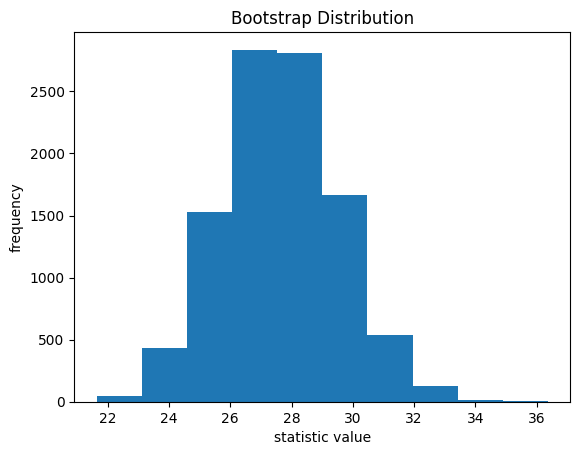